In [93]:
import pandas as pd
import numpy as np
import missingno as msno
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', -1)  # or 199

<ipython-input-93-43e98461f871>:6: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)  # or 199


In [21]:
busi_test = pd.read_csv("datasets/busi_test.csv", index_col=0)
busi_test

,country,isonum,isocode,year,start,start_year,ahead,ahead_year,logis,logis_year,bband,bband_year,redu,redu_year,hifi,hifi_year,affs,affs_year,ippr,ippr_year,insdtf,insdtf_year,creddtf,creddtf_year,elcostlnl,elcostlnl_year,stardtf,stardtf_year
1192,Afghanistan,4,AFG,2015,***,2014,***,2014,2.069573,2014,0.004795,2014,26.472107,--,3.633919,--,3.852955,--,2.457773,--,23.62,2015,45.0,2015,8.151823,2015,93.05,2015
1193,Angola,24,AGO,2015,***,2014,***,2014,2.542980,2014,0.412784,2014,31.007937,2014,2.593719,2014,3.236488,2014,2.257915,2014,0.00,2015,5.0,2015,6.421622,2015,76.79,2015
1194,Albania,8,ALB,2015,***,2014,***,2014,2.770000,2012,6.573716,2014,20.825397,2014,3.888581,2014,3.737438,2014,2.896221,2014,63.42,2015,65.0,2015,6.197258,2015,90.09,2015
1195,United Arab Emirates,784,ARE,2015,***,2014,***,2014,3.539098,2014,11.558400,2014,4.285714,2014,5.053419,2014,5.424749,2014,5.475348,2014,43.74,2015,45.0,2015,3.157000,2015,89.98,2015
1196,Argentina,32,ARG,2015,***,2014,***,2014,2.986475,2014,15.573113,2014,30.333333,2014,2.583314,2014,2.923875,2014,2.424609,2014,42.87,2015,50.0,2015,3.214868,2015,73.36,2015
1197,Armenia,51,ARM,2015,***,2014,***,2014,2.672723,2014,9.144970,2014,11.000000,2014,4.495402,2014,4.013332,2014,3.458405,2014,48.00,2015,65.0,2015,4.469350,2015,97.78,2015
1198,Australia,36,AUS,2015,***,2015,***,2015,3.810776,2014,27.659557,2014,11.666667,2014,2.707067,2014,5.207643,2014,5.494077,2014,81.69,2015,90.0,2015,2.128232,2015,96.47,2015
1199,Austria,40,AUT,2015,***,2015,***,2015,3.648587,2014,27.666916,2014,2.000000,2014,3.466161,2014,5.272805,2014,5.509294,2014,78.89,2015,60.0,2015,4.582924,2015,83.45,2015
1200,Azerbaijan,31,AZE,2015,***,2014,***,2014,2.448376,2014,19.948423,2014,21.666667,2014,4.408999,2014,4.054561,2014,3.518034,2014,44.68,2015,40.0,2015,4.640537,2015,97.75,2015
1201,Burundi,108,BDI,2015,***,2014,***,2014,2.565735,2014,0.016217,2014,15.888889,2014,3.275584,2014,2.732525,2014,2.629479,2014,30.46,2015,10.0,2015,9.699864,2015,94.51,2015


In [25]:
busi_test['stardtf'].describe()

count    298.000000
mean     83.158523 
std      12.034043 
min      31.360000 
25%      77.130000 
50%      85.420000 
75%      92.350000 
max      99.960000 
Name: stardtf, dtype: float64

In [18]:
busi_test.columns

Index(['country', 'isonum', 'isocode', 'year', 'start', 'start_year', 'ahead',
       'ahead_year', 'logis', 'logis_year', 'bband', 'bband_year', 'redu',
       'redu_year', 'hifi', 'hifi_year', 'affs', 'affs_year', 'ippr',
       'ippr_year', 'insdtf', 'insdtf_year', 'creddtf', 'creddtf_year',
       'elcostlnl', 'elcostlnl_year', 'stardtf', 'stardtf_year'],
      dtype='object')

In [17]:
econ_test = pd.read_csv("datasets/econ_test.csv", index_col=0)
econ_test

,country,isonum,isocode,year,comfy,comfy_year,livstd,livstd_year,barrier,barrier_year,amp,amp_year,parfem,parfem_year,banka,banka_year,povnahc,povnahc_year,povdday,povdday_year,lfpr,lfpr_year,urate,urate_year,eqi,eqi_year,edi,edi_year,gdp5,gdp5_year
1192,Afghanistan,4,AFG,2015,***,2015,***,2014,4.079783,--,3.438251,--,16.400000,2014,9.005013,2011,35.799999,2011,20.203930,--,48.900002,2014,9.100000,2014,0.715496,2010,2.726730,2010,0.029082,2015
1193,Angola,24,AGO,2015,***,2014,***,2014,2.879643,2015,2.034871,2015,64.699997,2014,39.203541,2011,36.599998,2008,30.129999,2008,71.099998,2014,6.800000,2014,0.434404,2010,6.336120,2010,0.017570,2015
1194,Albania,8,ALB,2015,***,2015,***,2015,3.674663,2015,3.392698,2015,51.700001,2014,28.268129,2011,14.300000,2012,1.060000,2012,63.000000,2014,16.100000,2014,0.889969,2010,2.908180,2010,0.027832,2015
1195,United Arab Emirates,784,ARE,2015,***,2015,***,2015,5.510078,2015,5.295191,2015,46.700001,2014,59.732368,2011,4.711563,--,0.023814,--,80.800003,2014,3.600000,2014,0.770421,2010,3.572280,2010,0.017219,2015
1196,Argentina,32,ARG,2015,***,2015,***,2015,2.933330,2015,3.031993,2015,55.400002,2014,33.130219,2011,22.344694,--,1.750000,2013,68.500000,2014,8.200000,2014,0.776706,2010,2.379530,2010,0.014131,2015
1197,Armenia,51,ARM,2015,***,2015,***,2015,4.301582,2015,3.646311,2015,58.799999,2014,17.486870,2011,30.000000,2014,2.440000,2013,67.800003,2014,17.100000,2014,0.825668,2010,3.179780,2010,0.039511,2015
1198,Australia,36,AUS,2015,***,2015,***,2015,4.517205,2015,4.627477,2015,70.699997,2014,99.064842,2011,0.140000,2012,0.075325,--,76.699997,2014,6.000000,2014,0.936947,2010,2.992160,2010,0.010547,2015
1199,Austria,40,AUT,2015,***,2015,***,2015,4.520902,2015,4.826891,2015,70.599998,2014,97.081741,2011,5.030950,--,0.081382,--,76.000000,2014,5.000000,2014,1.027740,2010,1.550120,2010,0.005094,2015
1200,Azerbaijan,31,AZE,2015,***,2015,***,2015,4.372271,2015,3.238019,2015,68.400002,2014,14.900850,2011,6.000000,2012,0.000000,2005,71.199997,2014,5.200000,2014,0.629323,2010,5.853020,2010,0.021211,2015
1201,Burundi,108,BDI,2015,***,2014,***,2014,3.461480,2015,3.086381,2015,84.500000,2014,7.237984,2011,64.599998,2014,77.650002,2006,83.699997,2014,6.900000,2014,0.744101,2010,4.027590,2010,-0.004515,2015


In [29]:
datasets = ['busi', 'econ', 'educ', 'envi', 'gove', 'heal', 'pers', 'safe', 'soci']


In [46]:
new_datasets = [i + "_data" for i in datasets]
new_datasets

['busi_data',
 'econ_data',
 'educ_data',
 'envi_data',
 'gove_data',
 'heal_data',
 'pers_data',
 'safe_data',
 'soci_data']

In [86]:
# empty_lst = []
# for i in range(len(datasets)):
#     ds = datasets[i] + "_test.csv"
#     df = pd.read_csv("datasets/" + ds, index_col = 0)
# #     print(new_datasets[i])
#     for j in df.columns:
#         names = []
#         names.append(datasets[i] + j)
#     datasets[i].columns = names

# datasets[1].head()
        

   
 

In [75]:
busi_train = pd.read_csv("datasets/busi_train.csv", index_col=0)
busi_names = []
for i in busi_train.columns:
    busi_names.append("busi_" + i)

busi_train.columns = busi_names

econ_train = pd.read_csv("datasets/econ_train.csv", index_col=0)
econ_names = []
for i in econ_train.columns:
    econ_names.append("econ_" + i)

econ_train.columns = econ_names

educ_train = pd.read_csv("datasets/educ_train.csv", index_col=0)
educ_names = []
for i in educ_train.columns:
    educ_names.append("educ_" + i)

educ_train.columns = educ_names

envi_train = pd.read_csv("datasets/envi_train.csv", index_col=0)
envi_names = []
for i in envi_train.columns:
    envi_names.append("envi_" + i)

envi_train.columns = envi_names

gove_train = pd.read_csv("datasets/gove_train.csv", index_col=0)
gove_names = []
for i in gove_train.columns:
    gove_names.append("gove_" + i)

gove_train.columns = gove_names

heal_train = pd.read_csv("datasets/heal_train.csv", index_col=0)
heal_names = []
for i in heal_train.columns:
    heal_names.append("heal_" + i)

heal_train.columns = heal_names

pers_train = pd.read_csv("datasets/pers_train.csv", index_col=0)
pers_names = []
for i in pers_train.columns:
    pers_names.append("pers_" + i)

pers_train.columns = pers_names

safe_train = pd.read_csv("datasets/safe_train.csv", index_col=0)
safe_names = []
for i in safe_train.columns:
    safe_names.append("safe_" + i)

econ_train.columns = econ_names

soci_train = pd.read_csv("datasets/soci_train.csv", index_col=0)
soci_names = []
for i in soci_train.columns:
    soci_names.append("soci_" + i)

soci_train.columns = soci_names
    

In [58]:
busi_test = pd.read_csv("datasets/busi_test.csv", index_col=0)
busi_names = []
for i in busi_test.columns:
    busi_names.append("busi_" + i)

busi_test.columns = busi_names

econ_test = pd.read_csv("datasets/econ_test.csv", index_col=0)
econ_names = []
for i in econ_test.columns:
    econ_names.append("econ_" + i)

econ_test.columns = econ_names

educ_test = pd.read_csv("datasets/educ_test.csv", index_col=0)
educ_names = []
for i in educ_test.columns:
    educ_names.append("educ_" + i)

educ_test.columns = educ_names

envi_test = pd.read_csv("datasets/envi_test.csv", index_col=0)
envi_names = []
for i in envi_test.columns:
    envi_names.append("envi_" + i)

envi_test.columns = envi_names

gove_test = pd.read_csv("datasets/gove_test.csv", index_col=0)
gove_names = []
for i in gove_test.columns:
    gove_names.append("gove_" + i)

gove_test.columns = gove_names

heal_test = pd.read_csv("datasets/heal_test.csv", index_col=0)
heal_names = []
for i in heal_test.columns:
    heal_names.append("heal_" + i)

heal_test.columns = heal_names

pers_test = pd.read_csv("datasets/pers_test.csv", index_col=0)
pers_names = []
for i in pers_test.columns:
    pers_names.append("pers_" + i)

pers_test.columns = pers_names

safe_test = pd.read_csv("datasets/safe_test.csv", index_col=0)
safe_names = []
for i in safe_test.columns:
    safe_names.append("safe_" + i)

econ_test.columns = econ_names

soci_test = pd.read_csv("datasets/soci_test.csv", index_col=0)
soci_names = []
for i in soci_test.columns:
    soci_names.append("soci_" + i)

soci_test.columns = soci_names
    

In [60]:
soci_test

,soci_country,soci_isonum,soci_isocode,soci_year,soci_strange,soci_strange_year,soci_polic,soci_polic_year,soci_respect,soci_respect_year,soci_friends,soci_friends_year,soci_voice,soci_voice_year,soci_vtf,soci_vtf_year,soci_finhelp,soci_finhelp_year,soci_volunt,soci_volunt_year,soci_help,soci_help_year,soci_donate,soci_donate_year
1192,Afghanistan,4,AFG,2015,***,2015,***,2015,***,2015,***,2015,***,2015,20.623501,2015,***,2015,***,2015,***,2015,***,2015
1193,Angola,24,AGO,2015,***,2014,***,2014,***,2014,***,2014,***,2013,25.100000,2015,***,2014,***,2014,***,2014,***,2014
1194,Albania,8,ALB,2015,***,2015,***,2015,***,2015,***,2015,***,2015,50.644501,2015,***,2015,***,2015,***,2015,***,2015
1195,United Arab Emirates,784,ARE,2015,***,2015,***,--,***,2015,***,2015,***,2010,0.000000,2015,***,2015,***,2015,***,2015,***,2015
1196,Argentina,32,ARG,2015,***,2015,***,2015,***,2015,***,2015,***,2015,77.016499,2015,***,2015,***,2015,***,2015,***,2015
1197,Armenia,51,ARM,2015,***,2015,***,2015,***,2015,***,2015,***,2015,47.152500,2015,***,2015,***,2015,***,2015,***,2015
1198,Australia,36,AUS,2015,***,2015,***,2015,***,2015,***,2015,***,2015,93.230003,2015,***,2015,***,2015,***,2015,***,2015
1199,Austria,40,AUT,2015,***,2015,***,2015,***,2015,***,2015,***,2015,74.910004,2015,***,2015,***,2015,***,2015,***,2015
1200,Azerbaijan,31,AZE,2015,***,2015,***,2015,***,2015,***,2015,***,2015,8.331000,2015,***,2015,***,2015,***,2015,***,2015
1201,Burundi,108,BDI,2015,***,2014,***,2014,***,2014,***,2014,***,2008,33.443999,2015,***,2014,***,2014,***,2014,***,2014


In [76]:
soci_train.shape

(1192, 26)

In [81]:
soci_test.shape

econ = pd.concat([econ_train, econ_test])
soci = pd.concat([soci_train, soci_test])
heal = pd.concat([heal_train, heal_test])
busi = pd.concat([busi_train, busi_test])
envi = pd.concat([envi_train, envi_test])
pers= pd.concat([pers_train, pers_test])
educ = pd.concat([educ_train, educ_test])
safe = pd.concat([safe_train, safe_test])
gove = pd.concat([gove_train, gove_test])


In [85]:
final = pd.concat([econ,soci,heal,busi,envi,pers,educ,safe,gove],axis=1)
final.head(5)

,econ_country,econ_isonum,econ_isocode,econ_year,econ_rank_econ,econ_econ,econ_comfy,econ_comfy_year,econ_livstd,econ_livstd_year,econ_barrier,econ_barrier_year,econ_amp,econ_amp_year,econ_parfem,econ_parfem_year,econ_banka,econ_banka_year,econ_povnahc,econ_povnahc_year,econ_povdday,econ_povdday_year,econ_lfpr,econ_lfpr_year,econ_urate,econ_urate_year,econ_eqi,econ_eqi_year,econ_edi,econ_edi_year,econ_gdp5,econ_gdp5_year,soci_country,soci_isonum,soci_isocode,soci_year,soci_rank_soci,soci_soci,soci_strange,soci_strange_year,soci_polic,soci_polic_year,soci_respect,soci_respect_year,soci_friends,soci_friends_year,soci_voice,soci_voice_year,soci_vtf,soci_vtf_year,soci_finhelp,soci_finhelp_year,soci_volunt,soci_volunt_year,soci_help,soci_help_year,soci_donate,soci_donate_year,heal_country,heal_isonum,heal_isocode,heal_year,heal_rank_heal,heal_heal,heal_Sadness,heal_Sadness_year,heal_Joy,heal_Joy_year,heal_healp,heal_healp_year,heal_cityheal,heal_cityheal_year,heal_tblnl,heal_tblnl_year,heal_Obesity,heal_Obesity_year,heal_mort,heal_mort_year,heal_meandiabetes,heal_meandiabetes_year,heal_leb,heal_leb_year,heal_dpt,heal_dpt_year,heal_imeas,heal_imeas_year,heal_impsan,heal_impsan_year,busi_country,busi_isonum,busi_isocode,busi_year,busi_rank_busi,busi_busi,busi_start,busi_start_year,busi_ahead,busi_ahead_year,busi_logis,busi_logis_year,busi_bband,busi_bband_year,busi_redu,busi_redu_year,busi_hifi,busi_hifi_year,busi_affs,busi_affs_year,busi_ippr,busi_ippr_year,busi_insdtf,busi_insdtf_year,busi_creddtf,busi_creddtf_year,busi_elcostlnl,busi_elcostlnl_year,busi_stardtf,busi_stardtf_year,envi_country,envi_isonum,envi_isocode,envi_year,envi_rank_envi,envi_envi,envi_fwateruse,envi_fwateruse_year,envi_preserve,envi_preserve_year,envi_airpollution,envi_airpollution_year,envi_wasterwater,envi_wasterwater_year,envi_fishstock,envi_fishstock_year,envi_marineprotect,envi_marineprotect_year,envi_improved_drinkwater,envi_improved_drinkwater_year,envi_pestreg,envi_pestreg_year,envi_terrestprotect,envi_terrestprotect_year,pers_country,pers_isonum,pers_isocode,pers_year,pers_rank_pers,pers_pers,pers_racial,pers_racial_year,pers_immig,pers_immig_year,pers_freedom,pers_freedom_year,pers_lgbx,pers_lgbx_year,pers_propright,pers_propright_year,pers_rrgov,pers_rrgov_year,pers_rrsoc,pers_rrsoc_year,pers_lgbt_rights,pers_lgbt_rights_year,pers_deathpen,pers_deathpen_year,pers_civlib,pers_civlib_year,pers_conscription,pers_conscription_year,pers_pf,pers_pf_year,educ_country,educ_isonum,educ_isocode,educ_year,educ_rank_educ,educ_educ,educ_qslnl,educ_qslnl_year,educ_edsys,educ_edsys_year,educ_kids,educ_kids_year,educ_secvocp,educ_secvocp_year,educ_teryrs,educ_teryrs_year,educ_edqualsc,educ_edqualsc_year,educ_gbrata,educ_gbrata_year,educ_secyrs,educ_secyrs_year,educ_Ginih15,educ_Ginih15_year,educ_prcompc,educ_prcompc_year,educ_lityf,educ_lityf_year,educ_litaf,educ_litaf_year,country,isonum,isocode,year,rank_safe,safe,shelter,shelter_year,food,food_year,walking,walking_year,stolen,stolen_year,warcasual,warcasual_year,pts,pts_year,tdeathslnl5,tdeathslnl5_year,refugee_oriln,refugee_oriln_year,bdeathslnl,bdeathslnl_year,rdeathslnl,rdeathslnl_year,homilnl,homilnl_year,gove_country,gove_isonum,gove_isocode,gove_year,gove_rank_gove,gove_gove,gove_elfcr,gove_elfcr_year,gove_trang,gove_trang_year,gove_womenparl,gove_womenparl_year,gove_vapvt,gove_vapvt_year,gove_polity2,gove_polity2_year,gove_polrights,gove_polrights_year,gove_honeste,gove_honeste_year,gove_cfgov,gove_cfgov_year,gove_geff,gove_geff_year,gove_rqual,gove_rqual_year,gove_ticpi,gove_ticpi_year,gove_judi,gove_judi_year,gove_rlaw,gove_rlaw_year
0,Afghanistan,4,AFG,2007,115.0,53.251713,***,2008,***,2008,4.079783,--,3.438251,--,14.800000,2007,9.005013,2011,36.299999,2007,20.203930,--,49.000000,2007,8.4,2007,0.727475,2007,2.86369,2007,0.070104,2010,Afghanistan,4,AFG,2007,144.0,37.691658,***,2008,***,2008,***,2008,***,2010,***,2008,22.216499,2007,***,2011,***,2008,***,2008,***,2008,Afghanistan,4,AFG,2007,140.0,51.6008

In [91]:
final = final.replace("***", np.NaN)

In [100]:
final = final.dropna(axis = 1, how = 'all')

In [101]:
final.head()

,econ_country,econ_isonum,econ_isocode,econ_year,econ_rank_econ,econ_econ,econ_comfy_year,econ_livstd_year,econ_barrier,econ_barrier_year,econ_amp,econ_amp_year,econ_parfem,econ_parfem_year,econ_banka,econ_banka_year,econ_povnahc,econ_povnahc_year,econ_povdday,econ_povdday_year,econ_lfpr,econ_lfpr_year,econ_urate,econ_urate_year,econ_eqi,econ_eqi_year,econ_edi,econ_edi_year,econ_gdp5,econ_gdp5_year,soci_country,soci_isonum,soci_isocode,soci_year,soci_rank_soci,soci_soci,soci_strange_year,soci_polic_year,soci_respect_year,soci_friends_year,soci_voice_year,soci_vtf,soci_vtf_year,soci_finhelp_year,soci_volunt_year,soci_help_year,soci_donate_year,heal_country,heal_isonum,heal_isocode,heal_year,heal_rank_heal,heal_heal,heal_Sadness_year,heal_Joy_year,heal_healp_year,heal_cityheal_year,heal_tblnl,heal_tblnl_year,heal_Obesity,heal_Obesity_year,heal_mort,heal_mort_year,heal_meandiabetes,heal_meandiabetes_year,heal_leb,heal_leb_year,heal_dpt,heal_dpt_year,heal_imeas,heal_imeas_year,heal_impsan,heal_impsan_year,busi_country,busi_isonum,busi_isocode,busi_year,busi_rank_busi,busi_busi,busi_start_year,busi_ahead_year,busi_logis,busi_logis_year,busi_bband,busi_bband_year,busi_redu,busi_redu_year,busi_hifi,busi_hifi_year,busi_affs,busi_affs_year,busi_ippr,busi_ippr_year,busi_insdtf,busi_insdtf_year,busi_creddtf,busi_creddtf_year,busi_elcostlnl,busi_elcostlnl_year,busi_stardtf,busi_stardtf_year,envi_country,envi_isonum,envi_isocode,envi_year,envi_rank_envi,envi_envi,envi_fwateruse,envi_fwateruse_year,envi_preserve_year,envi_airpollution,envi_airpollution_year,envi_wasterwater,envi_wasterwater_year,envi_fishstock,envi_fishstock_year,envi_marineprotect,envi_marineprotect_year,envi_improved_drinkwater,envi_improved_drinkwater_year,envi_pestreg,envi_pestreg_year,envi_terrestprotect,envi_terrestprotect_year,pers_country,pers_isonum,pers_isocode,pers_year,pers_rank_pers,pers_pers,pers_racial_year,pers_immig_year,pers_freedom_year,pers_lgbx_year,pers_propright,pers_propright_year,pers_rrgov,pers_rrgov_year,pers_rrsoc,pers_rrsoc_year,pers_lgbt_rights,pers_lgbt_rights_year,pers_deathpen,pers_deathpen_year,pers_civlib,pers_civlib_year,pers_conscription,pers_conscription_year,pers_pf,pers_pf_year,educ_country,educ_isonum,educ_isocode,educ_year,educ_rank_educ,educ_educ,educ_qslnl,educ_qslnl_year,educ_edsys_year,educ_kids_year,educ_secvocp,educ_secvocp_year,educ_teryrs,educ_teryrs_year,educ_edqualsc,educ_edqualsc_year,educ_gbrata,educ_gbrata_year,educ_secyrs,educ_secyrs_year,educ_Ginih15,educ_Ginih15_year,educ_prcompc,educ_prcompc_year,educ_lityf,educ_lityf_year,educ_litaf,educ_litaf_year,country,isonum,isocode,year,rank_safe,safe,shelter_year,food_year,walking_year,stolen_year,warcasual,warcasual_year,pts,pts_year,tdeathslnl5,tdeathslnl5_year,refugee_oriln,refugee_oriln_year,bdeathslnl,bdeathslnl_year,rdeathslnl,rdeathslnl_year,homilnl,homilnl_year,gove_country,gove_isonum,gove_isocode,gove_year,gove_rank_gove,gove_gove,gove_elfcr,gove_elfcr_year,gove_trang,gove_trang_year,gove_womenparl,gove_womenparl_year,gove_vapvt,gove_vapvt_year,gove_polity2,gove_polity2_year,gove_polrights,gove_polrights_year,gove_honeste_year,gove_cfgov_year,gove_geff,gove_geff_year,gove_rqual,gove_rqual_year,gove_ticpi,gove_ticpi_year,gove_judi,gove_judi_year,gove_rlaw,gove_rlaw_year
0,Afghanistan,4,AFG,2007,115.0,53.251713,2008,2008,4.079783,--,3.438251,--,14.800000,2007,9.005013,2011,36.299999,2007,20.203930,--,49.000000,2007,8.4,2007,0.727475,2007,2.86369,2007,0.070104,2010,Afghanistan,4,AFG,2007,144.0,37.691658,2008,2008,2008,2010,2008,22.216499,2007,2011,2008,2008,2008,Afghanistan,4,AFG,2007,140.0,51.600807,2008,2008,2008,2008,3.485909,--,2.4,2010,848.839294,--,6.913508,2007,57.833829,2007,63,2007,55,2007,27.4,2007,Afghanistan,4,AFG,2007,127.0,35.308167,2011,2008,1.21,2007,0.001898,2007,26.472107,--,3.633919,--,3.852955,--,2.457773,--,27.07,2007,6.25,2007,6.426812,2009,82.87,2007,Afghanistan,4,AFG,2007,146.0,39.293343,43.011665,2013,2008,0.1400,2007,0.000000,2014,35.323078,-

In [103]:
final.head()

,econ_country,econ_isonum,econ_isocode,econ_year,econ_rank_econ,econ_econ,econ_comfy_year,econ_livstd_year,econ_barrier,econ_barrier_year,econ_amp,econ_amp_year,econ_parfem,econ_parfem_year,econ_banka,econ_banka_year,econ_povnahc,econ_povnahc_year,econ_povdday,econ_povdday_year,econ_lfpr,econ_lfpr_year,econ_urate,econ_urate_year,econ_eqi,econ_eqi_year,econ_edi,econ_edi_year,econ_gdp5,econ_gdp5_year,soci_country,soci_isonum,soci_isocode,soci_year,soci_rank_soci,soci_soci,soci_strange_year,soci_polic_year,soci_respect_year,soci_friends_year,soci_voice_year,soci_vtf,soci_vtf_year,soci_finhelp_year,soci_volunt_year,soci_help_year,soci_donate_year,heal_country,heal_isonum,heal_isocode,heal_year,heal_rank_heal,heal_heal,heal_Sadness_year,heal_Joy_year,heal_healp_year,heal_cityheal_year,heal_tblnl,heal_tblnl_year,heal_Obesity,heal_Obesity_year,heal_mort,heal_mort_year,heal_meandiabetes,heal_meandiabetes_year,heal_leb,heal_leb_year,heal_dpt,heal_dpt_year,heal_imeas,heal_imeas_year,heal_impsan,heal_impsan_year,busi_country,busi_isonum,busi_isocode,busi_year,busi_rank_busi,busi_busi,busi_start_year,busi_ahead_year,busi_logis,busi_logis_year,busi_bband,busi_bband_year,busi_redu,busi_redu_year,busi_hifi,busi_hifi_year,busi_affs,busi_affs_year,busi_ippr,busi_ippr_year,busi_insdtf,busi_insdtf_year,busi_creddtf,busi_creddtf_year,busi_elcostlnl,busi_elcostlnl_year,busi_stardtf,busi_stardtf_year,envi_country,envi_isonum,envi_isocode,envi_year,envi_rank_envi,envi_envi,envi_fwateruse,envi_fwateruse_year,envi_preserve_year,envi_airpollution,envi_airpollution_year,envi_wasterwater,envi_wasterwater_year,envi_fishstock,envi_fishstock_year,envi_marineprotect,envi_marineprotect_year,envi_improved_drinkwater,envi_improved_drinkwater_year,envi_pestreg,envi_pestreg_year,envi_terrestprotect,envi_terrestprotect_year,pers_country,pers_isonum,pers_isocode,pers_year,pers_rank_pers,pers_pers,pers_racial_year,pers_immig_year,pers_freedom_year,pers_lgbx_year,pers_propright,pers_propright_year,pers_rrgov,pers_rrgov_year,pers_rrsoc,pers_rrsoc_year,pers_lgbt_rights,pers_lgbt_rights_year,pers_deathpen,pers_deathpen_year,pers_civlib,pers_civlib_year,pers_conscription,pers_conscription_year,pers_pf,pers_pf_year,educ_country,educ_isonum,educ_isocode,educ_year,educ_rank_educ,educ_educ,educ_qslnl,educ_qslnl_year,educ_edsys_year,educ_kids_year,educ_secvocp,educ_secvocp_year,educ_teryrs,educ_teryrs_year,educ_edqualsc,educ_edqualsc_year,educ_gbrata,educ_gbrata_year,educ_secyrs,educ_secyrs_year,educ_Ginih15,educ_Ginih15_year,educ_prcompc,educ_prcompc_year,educ_lityf,educ_lityf_year,educ_litaf,educ_litaf_year,country,isonum,isocode,year,rank_safe,safe,shelter_year,food_year,walking_year,stolen_year,warcasual,warcasual_year,pts,pts_year,tdeathslnl5,tdeathslnl5_year,refugee_oriln,refugee_oriln_year,bdeathslnl,bdeathslnl_year,rdeathslnl,rdeathslnl_year,homilnl,homilnl_year,gove_country,gove_isonum,gove_isocode,gove_year,gove_rank_gove,gove_gove,gove_elfcr,gove_elfcr_year,gove_trang,gove_trang_year,gove_womenparl,gove_womenparl_year,gove_vapvt,gove_vapvt_year,gove_polity2,gove_polity2_year,gove_polrights,gove_polrights_year,gove_honeste_year,gove_cfgov_year,gove_geff,gove_geff_year,gove_rqual,gove_rqual_year,gove_ticpi,gove_ticpi_year,gove_judi,gove_judi_year,gove_rlaw,gove_rlaw_year
0,Afghanistan,4,AFG,2007,115.0,53.251713,2008,2008,4.079783,--,3.438251,--,14.800000,2007,9.005013,2011,36.299999,2007,20.203930,--,49.000000,2007,8.4,2007,0.727475,2007,2.86369,2007,0.070104,2010,Afghanistan,4,AFG,2007,144.0,37.691658,2008,2008,2008,2010,2008,22.216499,2007,2011,2008,2008,2008,Afghanistan,4,AFG,2007,140.0,51.600807,2008,2008,2008,2008,3.485909,--,2.4,2010,848.839294,--,6.913508,2007,57.833829,2007,63,2007,55,2007,27.4,2007,Afghanistan,4,AFG,2007,127.0,35.308167,2011,2008,1.21,2007,0.001898,2007,26.472107,--,3.633919,--,3.852955,--,2.457773,--,27.07,2007,6.25,2007,6.426812,2009,82.87,2007,Afghanistan,4,AFG,2007,146.0,39.293343,43.011665,2013,2008,0.1400,2007,0.000000,2014,35.323078,-

In [105]:
final = final.rename({'econ_country': 'Country', 'econ_isonum': 'ISO_num'})
final.drop([i for i in final.columns if 'country' in i or 'iso' in i], axis =1)

,econ_year,econ_rank_econ,econ_econ,econ_comfy_year,econ_livstd_year,econ_barrier,econ_barrier_year,econ_amp,econ_amp_year,econ_parfem,econ_parfem_year,econ_banka,econ_banka_year,econ_povnahc,econ_povnahc_year,econ_povdday,econ_povdday_year,econ_lfpr,econ_lfpr_year,econ_urate,econ_urate_year,econ_eqi,econ_eqi_year,econ_edi,econ_edi_year,econ_gdp5,econ_gdp5_year,soci_year,soci_rank_soci,soci_soci,soci_strange_year,soci_polic_year,soci_respect_year,soci_friends_year,soci_voice_year,soci_vtf,soci_vtf_year,soci_finhelp_year,soci_volunt_year,soci_help_year,soci_donate_year,heal_year,heal_rank_heal,heal_heal,heal_Sadness_year,heal_Joy_year,heal_healp_year,heal_cityheal_year,heal_tblnl,heal_tblnl_year,heal_Obesity,heal_Obesity_year,heal_mort,heal_mort_year,heal_meandiabetes,heal_meandiabetes_year,heal_leb,heal_leb_year,heal_dpt,heal_dpt_year,heal_imeas,heal_imeas_year,heal_impsan,heal_impsan_year,busi_year,busi_rank_busi,busi_busi,busi_start_year,busi_ahead_year,busi_logis,busi_logis_year,busi_bband,busi_bband_year,busi_redu,busi_redu_year,busi_hifi,busi_hifi_year,busi_affs,busi_affs_year,busi_ippr,busi_ippr_year,busi_insdtf,busi_insdtf_year,busi_creddtf,busi_creddtf_year,busi_elcostlnl,busi_elcostlnl_year,busi_stardtf,busi_stardtf_year,envi_year,envi_rank_envi,envi_envi,envi_fwateruse,envi_fwateruse_year,envi_preserve_year,envi_airpollution,envi_airpollution_year,envi_wasterwater,envi_wasterwater_year,envi_fishstock,envi_fishstock_year,envi_marineprotect,envi_marineprotect_year,envi_improved_drinkwater,envi_improved_drinkwater_year,envi_pestreg,envi_pestreg_year,envi_terrestprotect,envi_terrestprotect_year,pers_year,pers_rank_pers,pers_pers,pers_racial_year,pers_immig_year,pers_freedom_year,pers_lgbx_year,pers_propright,pers_propright_year,pers_rrgov,pers_rrgov_year,pers_rrsoc,pers_rrsoc_year,pers_lgbt_rights,pers_lgbt_rights_year,pers_deathpen,pers_deathpen_year,pers_civlib,pers_civlib_year,pers_conscription,pers_conscription_year,pers_pf,pers_pf_year,educ_year,educ_rank_educ,educ_educ,educ_qslnl,educ_qslnl_year,educ_edsys_year,educ_kids_year,educ_secvocp,educ_secvocp_year,educ_teryrs,educ_teryrs_year,educ_edqualsc,educ_edqualsc_year,educ_gbrata,educ_gbrata_year,educ_secyrs,educ_secyrs_year,educ_Ginih15,educ_Ginih15_year,educ_prcompc,educ_prcompc_year,educ_lityf,educ_lityf_year,educ_litaf,educ_litaf_year,year,rank_safe,safe,shelter_year,food_year,walking_year,stolen_year,warcasual,warcasual_year,pts,pts_year,tdeathslnl5,tdeathslnl5_year,refugee_oriln,refugee_oriln_year,bdeathslnl,bdeathslnl_year,rdeathslnl,rdeathslnl_year,homilnl,homilnl_year,gove_year,gove_rank_gove,gove_gove,gove_elfcr,gove_elfcr_year,gove_trang,gove_trang_year,gove_womenparl,gove_womenparl_year,gove_vapvt,gove_vapvt_year,gove_polity2,gove_polity2_year,gove_polrights,gove_polrights_year,gove_honeste_year,gove_cfgov_year,gove_geff,gove_geff_year,gove_rqual,gove_rqual_year,gove_ticpi,gove_ticpi_year,gove_judi,gove_judi_year,gove_rlaw,gove_rlaw_year
0,2007,115.0,53.251713,2008,2008,4.079783,--,3.438251,--,14.800000,2007,9.005013,2011,36.299999,2007,20.203930,--,49.000000,2007,8.400000,2007,0.727475,2007,2.863690,2007,0.070104,2010,2007,144.0,37.691658,2008,2008,2008,2010,2008,22.216499,2007,2011,2008,2008,2008,2007,140.0,51.600807,2008,2008,2008,2008,3.485909,--,2.400000,2010,848.839294,--,6.913508,2007,57.833829,2007,63,2007,55,2007,27.40,2007,2007,127.0,35.308167,2011,2008,1.210000,2007,0.001898,2007,26.472107,--,3.633919,--,3.852955,--,2.457773,--,27.07,2007,6.25,2007,6.426812,2009,82.87,2007,2007,146.0,39.293343,43.011665,2013,2008,0.140000,2007,0.000000,2014,35.323078,--,13.537368,--,42.600000,2007,0,2007,0.366882,2007,2007,142.0,32.290104,2008,2008,2008,2008,0,2015,5.3,2007,8.5,2007,0,2016,1,2007,3,2007,7.698071,--,71.000000,2007,2007,143.0,22.494400,-7.178585,2013,2008,2009,0.714436,2007,0.207426,2005,337.589355,--,0.430390,2007,0.821344,2005,0.695375,2005,71.159485,--,59.360146,2007,25.892309,2007,2007,149.0,37.240280,2008,2008,2008,2008,3.000000e+00,2007,5.

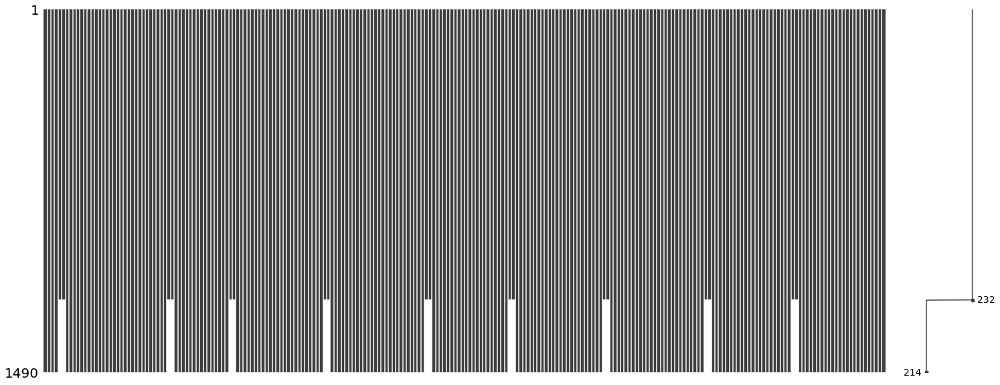

In [102]:
msno.matrix(final)

In [95]:
#pers_test.groupby('pers_country').count()

In [73]:
for i in new_datasets:
    print(i.shape)

(298, 28)
(298, 30)
(298, 28)
(298, 22)
(298, 30)
(298, 28)
(298, 28)
(298, 26)
(298, 24)
